# Import Common Useful Libraries 

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

# pd.set_option("display.max_rows", None)
# pd.set_option("display.max_columns", None)

# 1) Download the data file, load it

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/leaf-classification/train.csv.zip
/kaggle/input/leaf-classification/sample_submission.csv.zip
/kaggle/input/leaf-classification/images.zip
/kaggle/input/leaf-classification/test.csv.zip


In [3]:
import zipfile
from PIL import Image

imgzip = zipfile.ZipFile("/kaggle/input/leaf-classification/train.csv.zip", 'r')
files_info = imgzip.infolist()

for f in files_info:
    train_data = imgzip.open(f)

df = pd.read_csv(train_data)

# 1. Describe the data

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Columns: 194 entries, id to texture64
dtypes: float64(192), int64(1), object(1)
memory usage: 1.5+ MB


In [5]:
df.describe()

,id,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,799.595960,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,452.477568,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,415.250000,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,802.500000,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,1195.500000,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,1584.000000,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [6]:
df.head()

,id,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,1,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,2,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,3,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,5,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,6,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


<AxesSubplot:>

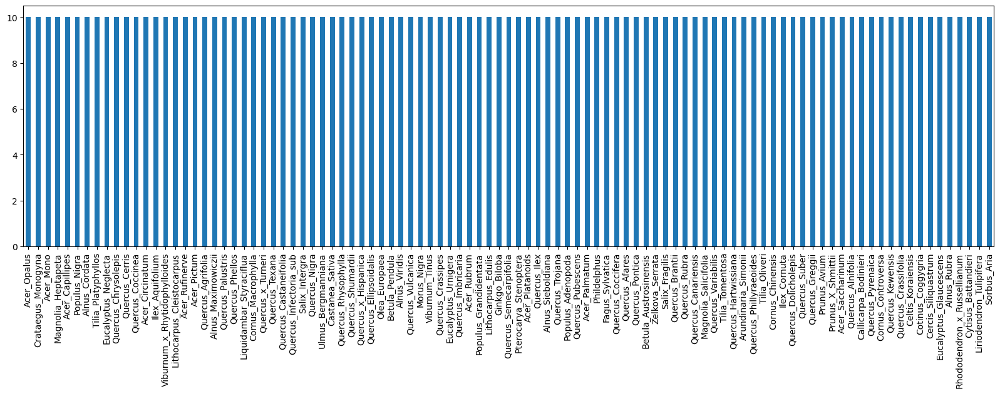

In [7]:
plt.rcParams["figure.figsize"] = (20,5)
df.species.value_counts().plot(kind='bar')

# 2. & 3. Clean the data and Check the data for missing values or duplicates and carry out proper correction methods

Data is almost clean,

It has:
- zero nulls
- zero missing values
- zero duplicated rows
- we can drop Id column
- we can drop columns with high correlation

In [8]:
# data has no nulls
df.isnull().sum().sum()

0

In [9]:
# data has no duplicated rows
df.duplicated().sum()

0

In [10]:
df.drop(columns=['id'], inplace=True)

# 6. Carry out required correlation analysis

Display Correlation Matrix

In [11]:
corr_matrix = df.loc[:, df.columns != 'species'].corr().abs()

single_corr_matrix = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k = 1).astype(bool))

high_corr_features = [column for column in single_corr_matrix.columns if any(single_corr_matrix[column] > 0.90)]

df = df.drop(columns = high_corr_features, axis = 1)

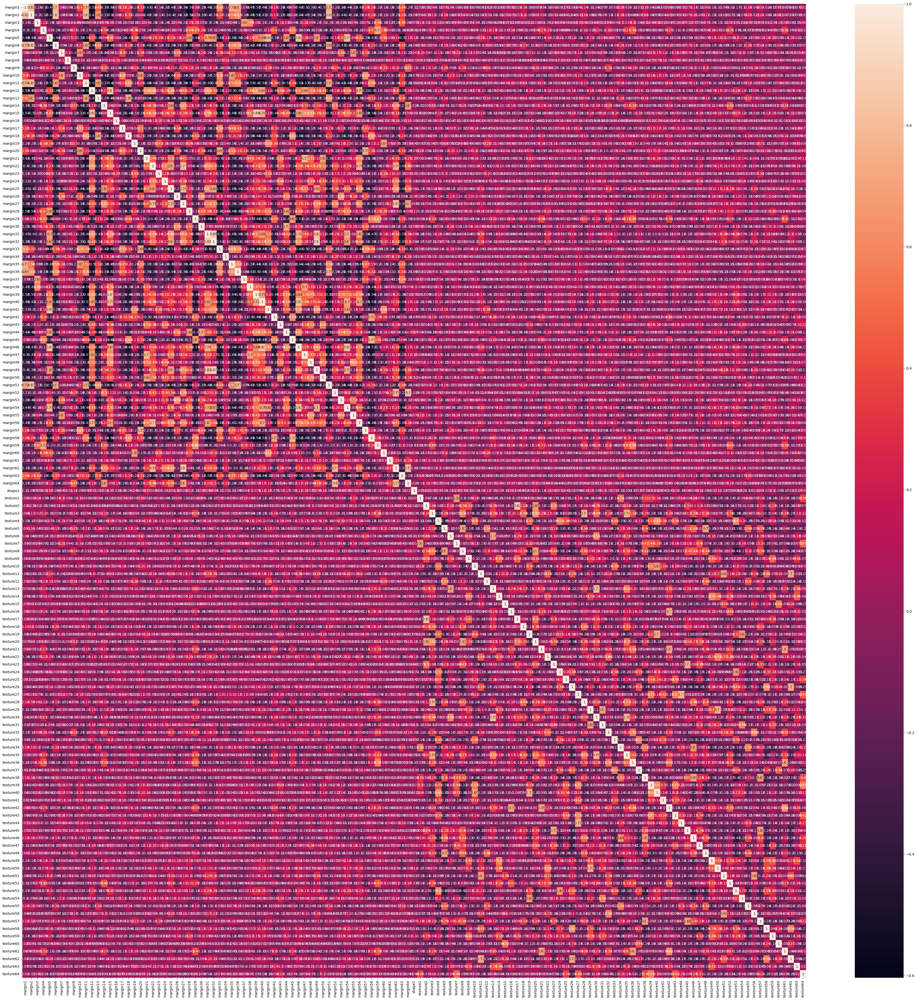

In [12]:
import seaborn as sns

plt.figure(figsize = (50, 50))
sns.heatmap(df.corr(), annot = True)
plt.show()

Remove features with high correlation

In [13]:
df.head()

,species,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
0,Acer_Opalus,0.007812,0.023438,0.023438,0.003906,0.011719,0.009766,0.027344,0.0,0.001953,...,0.007812,0.000000,0.002930,0.002930,0.035156,0.0,0.0,0.004883,0.000000,0.025391
1,Pterocarya_Stenoptera,0.005859,0.000000,0.031250,0.015625,0.025391,0.001953,0.019531,0.0,0.000000,...,0.000977,0.000000,0.000000,0.000977,0.023438,0.0,0.0,0.000977,0.039062,0.022461
2,Quercus_Hartwissiana,0.005859,0.009766,0.019531,0.007812,0.003906,0.005859,0.068359,0.0,0.000000,...,0.154300,0.000000,0.005859,0.000977,0.007812,0.0,0.0,0.000000,0.020508,0.002930
3,Tilia_Tomentosa,0.000000,0.003906,0.023438,0.005859,0.021484,0.019531,0.023438,0.0,0.013672,...,0.000000,0.000977,0.000000,0.000000,0.020508,0.0,0.0,0.017578,0.000000,0.047852
4,Quercus_Variabilis,0.005859,0.003906,0.048828,0.009766,0.013672,0.015625,0.005859,0.0,0.000000,...,0.096680,0.000000,0.021484,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.031250


# 4. Visualize the data using proper visualization methods. 

array([[<AxesSubplot:title={'center':'margin1'}>,
        <AxesSubplot:title={'center':'margin2'}>,
        <AxesSubplot:title={'center':'margin3'}>,
        <AxesSubplot:title={'center':'margin4'}>,
        <AxesSubplot:title={'center':'margin5'}>,
        <AxesSubplot:title={'center':'margin6'}>,
        <AxesSubplot:title={'center':'margin7'}>,
        <AxesSubplot:title={'center':'margin8'}>,
        <AxesSubplot:title={'center':'margin9'}>,
        <AxesSubplot:title={'center':'margin10'}>,
        <AxesSubplot:title={'center':'margin11'}>],
       [<AxesSubplot:title={'center':'margin12'}>,
        <AxesSubplot:title={'center':'margin13'}>,
        <AxesSubplot:title={'center':'margin14'}>,
        <AxesSubplot:title={'center':'margin15'}>,
        <AxesSubplot:title={'center':'margin16'}>,
        <AxesSubplot:title={'center':'margin17'}>,
        <AxesSubplot:title={'center':'margin18'}>,
        <AxesSubplot:title={'center':'margin19'}>,
        <AxesSubplot:title={'center':'m

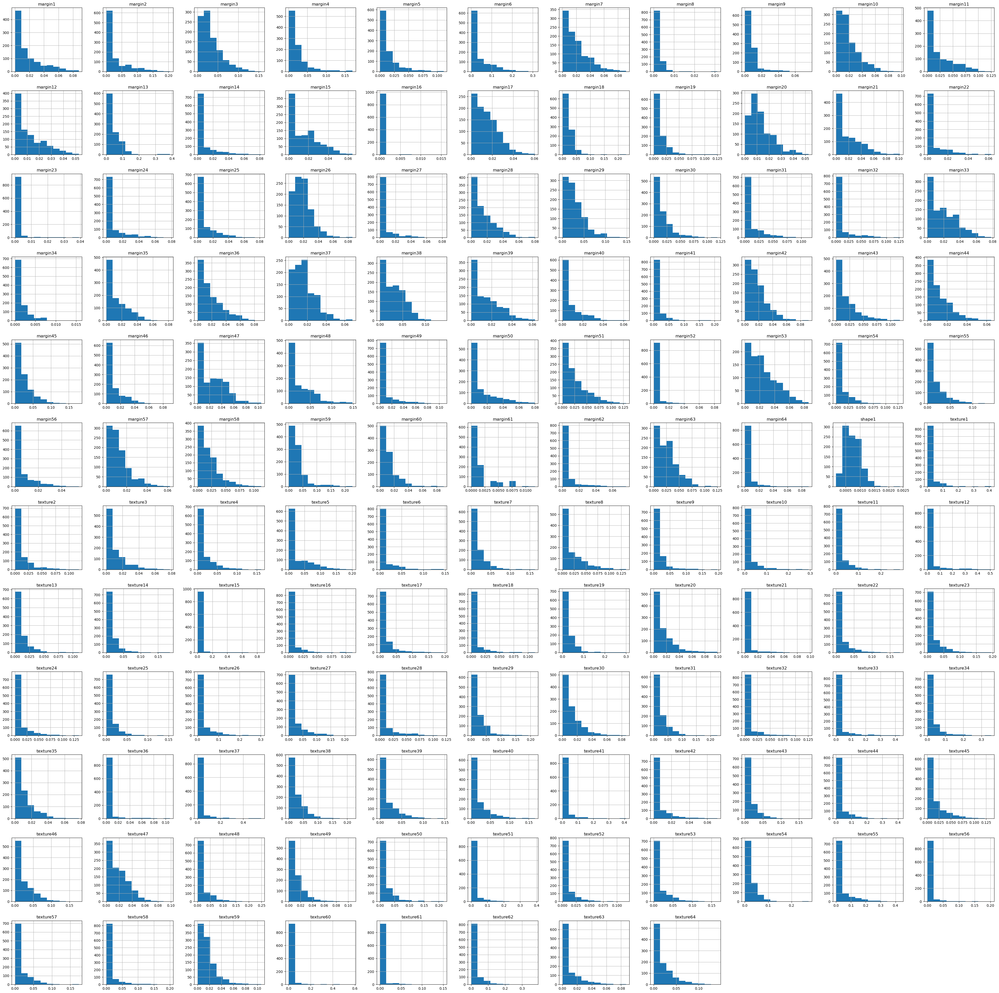

In [14]:
plt.rcParams["figure.figsize"] = (50,50)
df.hist()

# 5. Draw some of the images 

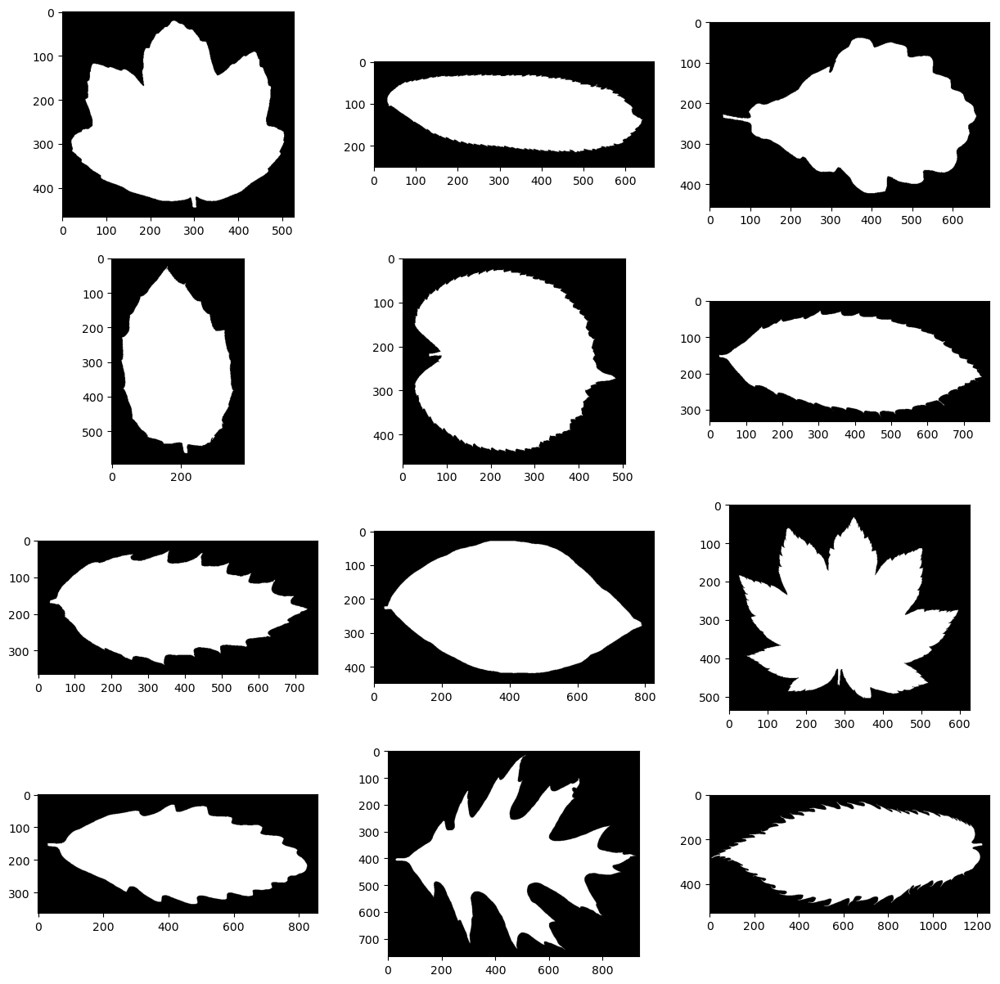

In [15]:
import matplotlib.image as mpimg

imgszip = zipfile.ZipFile("/kaggle/input/leaf-classification/images.zip", 'r')
imgszip.extractall()

rows = 4
cols = 3
fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15,15))
img_count = 1
for i in range(rows):
    for j in range(cols):   
        img = mpimg.imread(f'images/{img_count}.jpg')
        axes[i, j].imshow(img, cmap='gray')
        img_count += 1

plt.show()

# 2) divide the data into a training and test set using approximately 80% for training. 

In [16]:
from sklearn.model_selection import train_test_split, GridSearchCV

X = df.loc[:, df.columns != 'species']
y = df.loc[:, 'species']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, shuffle = True, random_state = 42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(792, 129)
(198, 129)
(792,)
(198,)


# 3) Decide if you need to standardize the data, by computing the mean and standard deviation for each feature dimension using the training set only, then subtracting the mean and dividing by the stdev for each feature and each sample.

In [17]:
df.describe()

,margin1,margin2,margin3,margin4,margin5,margin6,margin7,margin8,margin9,margin10,...,texture55,texture56,texture57,texture58,texture59,texture60,texture61,texture62,texture63,texture64
count,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,...,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000,990.000000
mean,0.017412,0.028539,0.031988,0.023280,0.014264,0.038579,0.019202,0.001083,0.007167,0.018639,...,0.036501,0.005024,0.015944,0.011586,0.016108,0.014017,0.002688,0.020291,0.008989,0.019420
std,0.019739,0.038855,0.025847,0.028411,0.018390,0.052030,0.017511,0.002743,0.008933,0.016071,...,0.063403,0.019321,0.023214,0.025040,0.015335,0.060151,0.011415,0.039040,0.013791,0.022768
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.001953,0.001953,0.013672,0.005859,0.001953,0.000000,0.005859,0.000000,0.001953,0.005859,...,0.000000,0.000000,0.000977,0.000000,0.004883,0.000000,0.000000,0.000000,0.000000,0.000977
50%,0.009766,0.011719,0.025391,0.013672,0.007812,0.015625,0.015625,0.000000,0.005859,0.015625,...,0.004883,0.000000,0.005859,0.000977,0.012695,0.000000,0.000000,0.003906,0.002930,0.011719
75%,0.025391,0.041016,0.044922,0.029297,0.017578,0.056153,0.029297,0.000000,0.007812,0.027344,...,0.043701,0.000000,0.022217,0.009766,0.021484,0.000000,0.000000,0.023438,0.012695,0.029297
max,0.087891,0.205080,0.156250,0.169920,0.111330,0.310550,0.091797,0.031250,0.076172,0.097656,...,0.429690,0.202150,0.172850,0.200200,0.106450,0.578130,0.151370,0.375980,0.086914,0.141600


In [18]:
X_train = (X_train - X_train.mean()) / X_train.std()

In [19]:
X_test = (X_test - X_train.mean()) / X_train.std()

# 4) Encode the labels

In [20]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)

In [21]:
import tensorflow as rf
from tensorflow.nn import tanh, softmax

import keras
from keras import Input
from keras.models import Model, Sequential
from keras.layers import Dense, Activation, Dropout 
from keras.optimizers import SGD, RMSprop, Adam
from keras.losses import SparseCategoricalCrossentropy
from keras.metrics import Accuracy
from keras.utils.vis_utils import plot_model
from keras.callbacks import EarlyStopping

# In this project, you need to implement a 3-layer MLP model (one input layer, one hidden layer with tanh activation and one output layer) which will be used to classify the data in Part I.

In [22]:
def create_model_Adam(hidden = 512, with_dropout = False, dropout_rate = 0.5, lr = 0.001, l2 = None):
    model = keras.Sequential()
    model.add(Input(shape = (129,)))
    model.add(Dense(units=hidden, activation='tanh'))
    model.add(Dense(99, activation = 'softmax'))

    if with_dropout:
        model.add(Dropout(dropout_rate))

    if l2 is None:
        optimizer = Adam(learning_rate = lr)
    else:
        optimizer = Adam(learning_rate = lr, decay = l2)

    model.compile(optimizer = optimizer, loss = SparseCategoricalCrossentropy(), metrics = ['accuracy'])

    return model

In [23]:
def create_model_SGD(hidden = 512, with_dropout = False, dropout_rate = 0.5, lr = 0.001, l2 = None):
    model = keras.Sequential()
    model.add(Input(shape = (129,)))
    model.add(Dense(units=hidden, activation='tanh'))
    model.add(Dense(99, activation = 'softmax'))

    if with_dropout:
        model.add(Dropout(dropout_rate))

    if l2 is None:
        optimizer = SGD(learning_rate = lr)
    else:
        optimizer = SGD(learning_rate = lr, decay = l2)

    model.compile(optimizer = optimizer, loss = SparseCategoricalCrossentropy(), metrics = ['accuracy'])

    return model

In [24]:
def create_model_RMSP(hidden = 512, with_dropout = False, dropout_rate = 0.5, lr = 0.001, l2 = None):
    model = keras.Sequential()
    model.add(Input(shape = (129,)))
    model.add(Dense(units=hidden, activation='tanh'))
    model.add(Dense(99, activation = 'softmax'))

    if with_dropout:
        model.add(Dropout(dropout_rate))

    if l2 is None:
        optimizer = RMSprop(learning_rate = lr)
    else:
        optimizer = RMSprop(learning_rate = lr, decay = l2)

    model.compile(optimizer = optimizer, loss = SparseCategoricalCrossentropy(), metrics = ['accuracy'])

    return model

In [25]:
def display_accuracy(history):
    plt.figure(figsize=(5,5))
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])  # RAISE ERROR
    plt.title('Model Accuracy')
    plt.ylabel('Accuracies')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

In [26]:
def display_val_accuracy(history):
    plt.figure(figsize=(5,5))
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss']) #RAISE ERROR
    plt.title('Model Loss')
    plt.ylabel('Losses')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()
    # test_los

In [27]:
def evaluate(model):
    print('Evaluate on test data')
    results = model.evaluate(X_test, y_test)
    print(f'Test Loss: {results[0]}, Test Accuracy: {results[1]}') 

# Hyperparameter tuning 
- Batch size: Number of examples per training iteration. 
- Hidden size: Try using different number of hidden nodes in your model and compare the performances. 
- Dropout is an effective strategy to defend against overfitting. Adding a dropout layer after the hidden layer, and try using different dropout rate to compare the performances. 
- Optimizer: Try using different optimizers such as SGD, Adam, RMSProp. 
- Regularization (weight decay): L2 regularization can be specified by setting the weight_decay parameter in optimizer. Try using different regularization factor and check the performance.
- Learning rate, Learning rate scheduler: Learning rate is key hyperparameter in model training, and you can gradually decreasing the learning rate to further improve your model. Try using different learning rate and different learning rate scheduler to compare the performance. 

In [28]:
callback = EarlyStopping(patience=5)

# Batch Size Trails

Start Batch Size Trails of values: [16, 32, 64, 128]
***********************************************************************************************
Start of Batch Size: 16, Trail


Epoch 1/50
45/45 [==============================] - 1s 7ms/step - loss: 4.8305 - accuracy: 0.2275 - val_loss: 2.8461 - val_accuracy: 0.4500
Epoch 2/50
45/45 [==============================] - 0s 3ms/step - loss: 2.7562 - accuracy: 0.7500 - val_loss: 1.6965 - val_accuracy: 0.7250
Epoch 3/50
45/45 [==============================] - 0s 3ms/step - loss: 2.0002 - accuracy: 0.8722 - val_loss: 1.1105 - val_accuracy: 0.8500
Epoch 4/50
45/45 [==============================] - 0s 3ms/step - loss: 1.6788 - accuracy: 0.9003 - val_loss: 0.8486 - val_accuracy: 0.8750
Epoch 5/50
45/45 [==============================] - 0s 3ms/step - loss: 1.7062 - accuracy: 0.8904 - val_loss: 0.6785 - val_accuracy: 0.8750
Epoch 6/50
45/45 [==============================] - 0s 3ms/step - loss: 1.4401 - accuracy: 0.9073 - val_loss: 0.5911 -

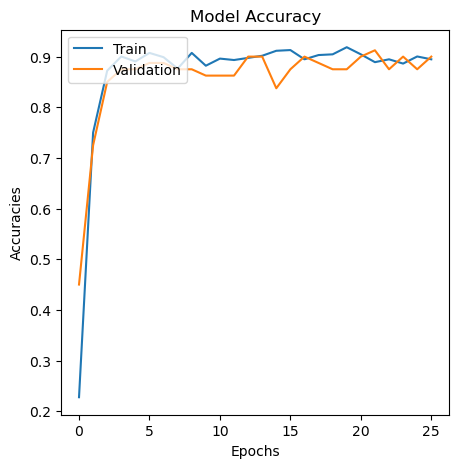

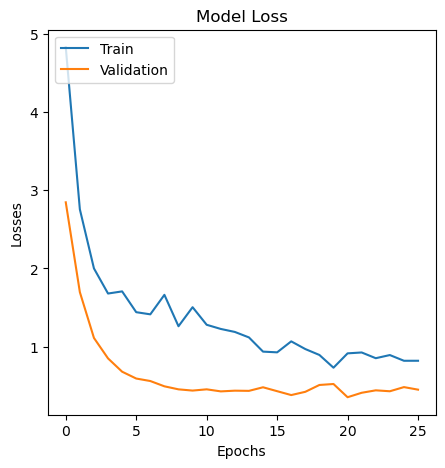


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 3.9583 - accuracy: 0.7475
Test Loss: 3.958308458328247, Test Accuracy: 0.747474730014801

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Batch Size: 32, Trail


Epoch 1/50
23/23 [==============================] - 1s 10ms/step - loss: 5.2022 - accuracy: 0.1278 - val_loss: 3.2475 - val_accuracy: 0.3375
Epoch 2/50
23/23 [==============================] - 0s 4ms/step - loss: 3.6312 - accuracy: 0.6264 - val_loss: 2.1953 - val_accuracy: 0.5875
Epoch 3/50
23/23 [==============================] - 0s 4ms/step - loss: 2.5382 - accuracy: 0.8287 - val_loss: 1.5461 - val_accuracy: 0.7500
Epoch 4/50
23/23 [==============================] - 0s 4ms/step - loss: 2.1349 - accuracy: 0.8694 - val_loss: 1.1325 - val_accuracy: 0.8125
Epoch 5/50
23/23 [===========

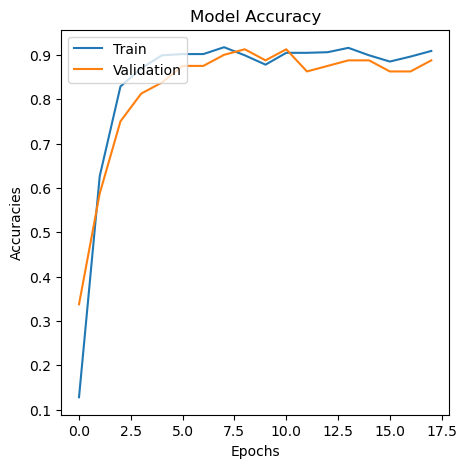

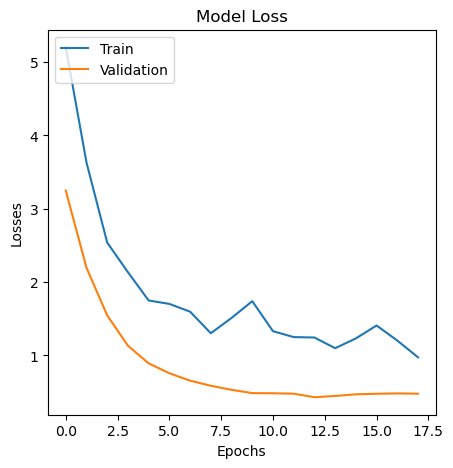


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2018 - accuracy: 0.7323
Test Loss: 4.201779842376709, Test Accuracy: 0.7323232293128967

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Batch Size: 64, Trail


Epoch 1/50
12/12 [==============================] - 1s 18ms/step - loss: 5.2102 - accuracy: 0.0913 - val_loss: 3.6757 - val_accuracy: 0.2125
Epoch 2/50
12/12 [==============================] - 0s 6ms/step - loss: 4.3590 - accuracy: 0.4368 - val_loss: 2.8851 - val_accuracy: 0.4750
Epoch 3/50
12/12 [==============================] - 0s 6ms/step - loss: 3.4097 - accuracy: 0.7093 - val_loss: 2.2669 - val_accuracy: 0.6250
Epoch 4/50
12/12 [==============================] - 0s 7ms/step - loss: 2.6897 - accuracy: 0.8020 - val_loss: 1.8096 - val_accuracy: 0.6875
Epoch 5/50
12/12 [==========

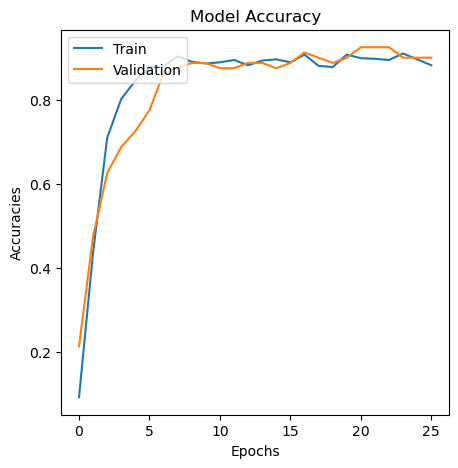

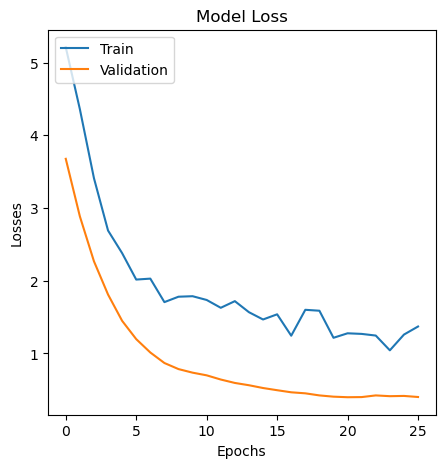


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2157 - accuracy: 0.6818
Test Loss: 4.215744972229004, Test Accuracy: 0.6818181872367859

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Batch Size: 128, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 5.8713 - accuracy: 0.0421 - val_loss: 4.1181 - val_accuracy: 0.1250
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 5.0543 - accuracy: 0.2402 - val_loss: 3.5071 - val_accuracy: 0.2375
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 4.4595 - accuracy: 0.4775 - val_loss: 2.9930 - val_accuracy: 0.4125
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 3.5577 - accuracy: 0.6419 - val_loss: 2.5609 - val_accuracy: 0.5125
Epoch 5/50
6/6 [===================

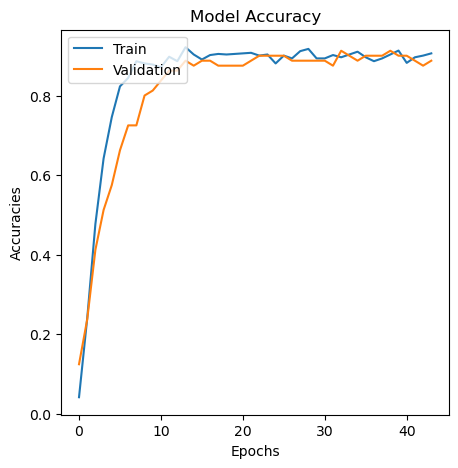

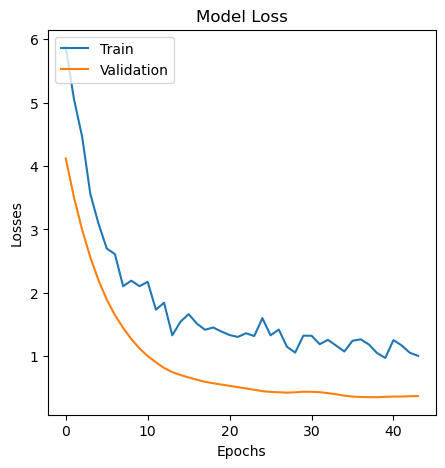


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.1690 - accuracy: 0.6111
Test Loss: 4.168968200683594, Test Accuracy: 0.6111111044883728

End of Trail
***********************************************************************************************


In [29]:
batch_sizes = [16, 32, 64, 128]
print(f'Start Batch Size Trails of values: {batch_sizes}')
for batch_size in batch_sizes:
    print('***********************************************************************************************')
    print(f'Start of Batch Size: {batch_size}, Trail')
    print()
    model = create_model_Adam(hidden = 256, with_dropout = True, dropout_rate = 0.1, lr = 0.001, l2 = None)
    print()
    history = model.fit(X_train, y_train, batch_size = batch_size, epochs = 50, validation_split = 0.1, callbacks=[callback])
    print()
    display_accuracy(history)
    print()
    display_val_accuracy(history)
    print()
    evaluate(model)
    print()
    print(f'End of Trail')
    print('***********************************************************************************************')

# Hidden Sizes Trails

Start Hidden Size Trails of values: [256, 512, 1024]
***********************************************************************************************
Start of Hidden Size: 256, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 5.4253 - accuracy: 0.0407 - val_loss: 4.0525 - val_accuracy: 0.1250
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 4.6613 - accuracy: 0.2570 - val_loss: 3.4407 - val_accuracy: 0.3125
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 3.9590 - accuracy: 0.5365 - val_loss: 2.9283 - val_accuracy: 0.4750
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 3.5206 - accuracy: 0.6713 - val_loss: 2.5161 - val_accuracy: 0.5125
Epoch 5/50
6/6 [==============================] - 0s 8ms/step - loss: 3.0850 - accuracy: 0.7669 - val_loss: 2.1605 - val_accuracy: 0.6250
Epoch 6/50
6/6 [==============================] - 0s 9ms/step - loss: 3.0510 - accuracy: 0.7851 - val_loss: 1.8609 - val_accu

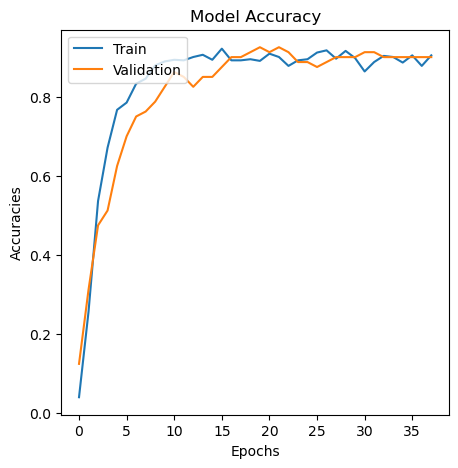

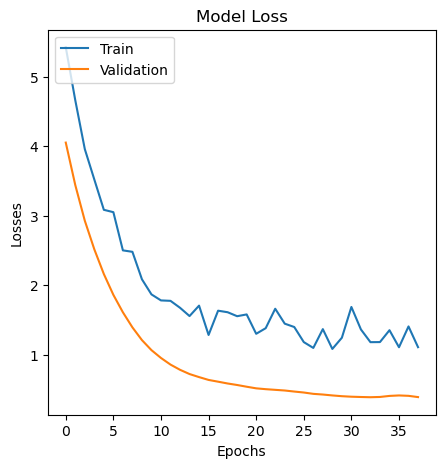


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2021 - accuracy: 0.5657
Test Loss: 4.2021050453186035, Test Accuracy: 0.5656565427780151

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Hidden Size: 512, Trail


Epoch 1/50
6/6 [==============================] - 1s 38ms/step - loss: 5.2404 - accuracy: 0.0618 - val_loss: 3.7088 - val_accuracy: 0.1625
Epoch 2/50
6/6 [==============================] - 0s 10ms/step - loss: 4.0339 - accuracy: 0.4860 - val_loss: 2.8015 - val_accuracy: 0.4250
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 2.9730 - accuracy: 0.7331 - val_loss: 2.1529 - val_accuracy: 0.6375
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 2.8095 - accuracy: 0.7949 - val_loss: 1.6861 - val_accuracy: 0.7125
Epoch 5/50
6/6 [================

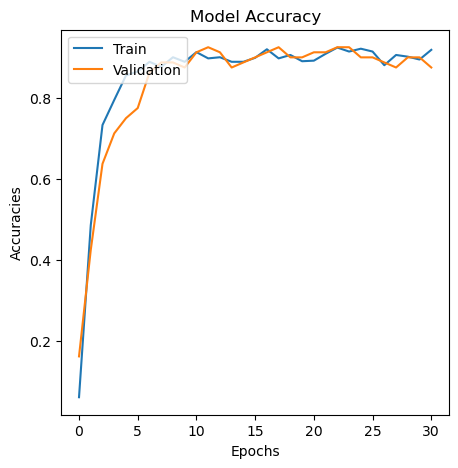

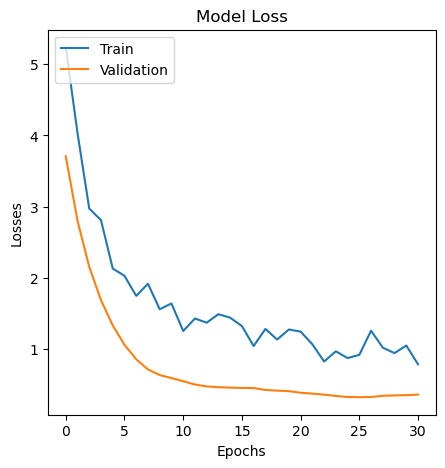


Evaluate on test data
7/7 [==============================] - 0s 3ms/step - loss: 4.1770 - accuracy: 0.7323
Test Loss: 4.176990985870361, Test Accuracy: 0.7323232293128967

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Hidden Size: 1024, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 5.2964 - accuracy: 0.1770 - val_loss: 2.9960 - val_accuracy: 0.4000
Epoch 2/50
6/6 [==============================] - 0s 10ms/step - loss: 3.2141 - accuracy: 0.7065 - val_loss: 1.8694 - val_accuracy: 0.6875
Epoch 3/50
6/6 [==============================] - 0s 14ms/step - loss: 2.5041 - accuracy: 0.8287 - val_loss: 1.1917 - val_accuracy: 0.7750
Epoch 4/50
6/6 [==============================] - 0s 11ms/step - loss: 1.9955 - accuracy: 0.8722 - val_loss: 0.8133 - val_accuracy: 0.8375
Epoch 5/50
6/6 [==============

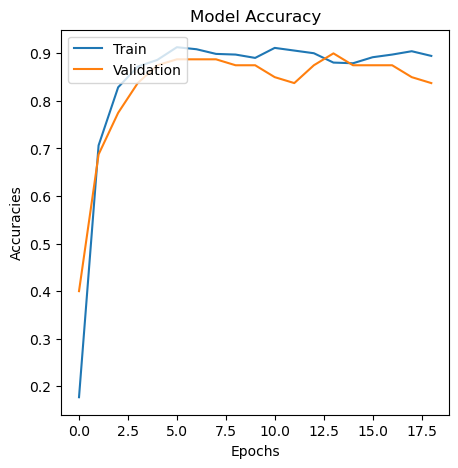

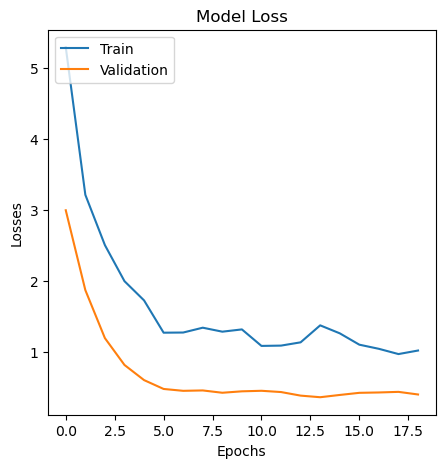


Evaluate on test data
7/7 [==============================] - 0s 3ms/step - loss: 4.1871 - accuracy: 0.7525
Test Loss: 4.187100887298584, Test Accuracy: 0.752525269985199

End of Trail
***********************************************************************************************


In [30]:
hiddens = [256, 512, 1024]
print(f'Start Hidden Size Trails of values: {hiddens}')
for hidden in hiddens:
    print('***********************************************************************************************')
    print(f'Start of Hidden Size: {hidden}, Trail')
    print()
    model = create_model_Adam(hidden = hidden, with_dropout = True, dropout_rate = 0.1, lr = 0.001, l2 = None)
    print()
    history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
    print()
    display_accuracy(history)
    print()
    display_val_accuracy(history)
    print()
    evaluate(model)
    print()
    print(f'End of Trail')
    print('***********************************************************************************************')

# Dropout Trails

Start Dropout Rate Trails of values: [0.1, 0.3, 0.5]
***********************************************************************************************
Start of Dropout Rate: 0.1, Trail


Epoch 1/50
6/6 [==============================] - 1s 37ms/step - loss: 5.6972 - accuracy: 0.0281 - val_loss: 4.0346 - val_accuracy: 0.1250
Epoch 2/50
6/6 [==============================] - 0s 8ms/step - loss: 4.7636 - accuracy: 0.2416 - val_loss: 3.4504 - val_accuracy: 0.2500
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 4.2088 - accuracy: 0.4621 - val_loss: 2.9625 - val_accuracy: 0.3750
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 3.2522 - accuracy: 0.6447 - val_loss: 2.5545 - val_accuracy: 0.4500
Epoch 5/50
6/6 [==============================] - 0s 9ms/step - loss: 3.0883 - accuracy: 0.7360 - val_loss: 2.2098 - val_accuracy: 0.5375
Epoch 6/50
6/6 [==============================] - 0s 8ms/step - loss: 2.8062 - accuracy: 0.7963 - val_loss: 1.9084 - val_acc

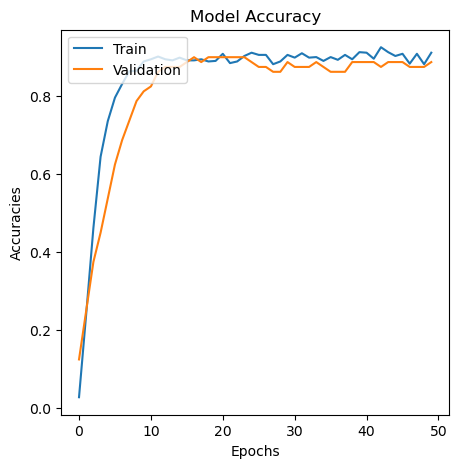

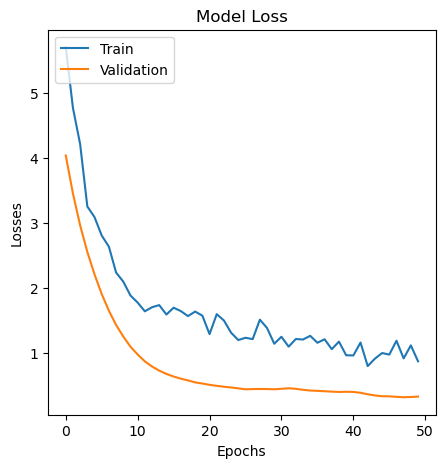


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.1346 - accuracy: 0.5960
Test Loss: 4.134624481201172, Test Accuracy: 0.5959596037864685

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Dropout Rate: 0.3, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 7.9352 - accuracy: 0.0393 - val_loss: 4.2298 - val_accuracy: 0.1000
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 7.2644 - accuracy: 0.1826 - val_loss: 3.6690 - val_accuracy: 0.2250
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 6.8153 - accuracy: 0.3525 - val_loss: 3.1921 - val_accuracy: 0.3125
Epoch 4/50
6/6 [==============================] - 0s 10ms/step - loss: 6.3089 - accuracy: 0.4902 - val_loss: 2.7805 - val_accuracy: 0.4625
Epoch 5/50
6/6 [================

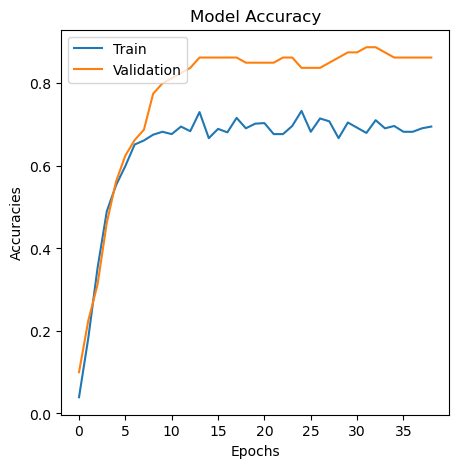

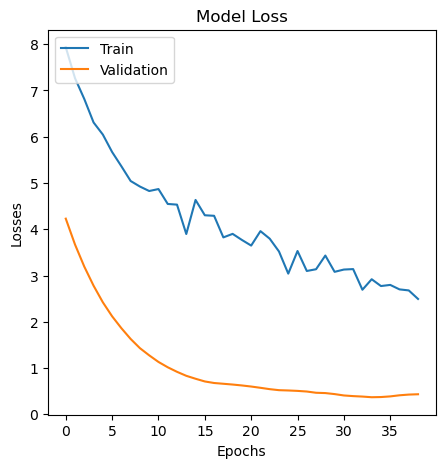


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.0482 - accuracy: 0.6616
Test Loss: 4.048211574554443, Test Accuracy: 0.6616161465644836

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Dropout Rate: 0.5, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 9.8893 - accuracy: 0.0295 - val_loss: 4.2809 - val_accuracy: 0.0750
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 9.5175 - accuracy: 0.1320 - val_loss: 3.7314 - val_accuracy: 0.2750
Epoch 3/50
6/6 [==============================] - 0s 10ms/step - loss: 9.0156 - accuracy: 0.2542 - val_loss: 3.2669 - val_accuracy: 0.3375
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 9.3499 - accuracy: 0.3230 - val_loss: 2.8861 - val_accuracy: 0.4500
Epoch 5/50
6/6 [================

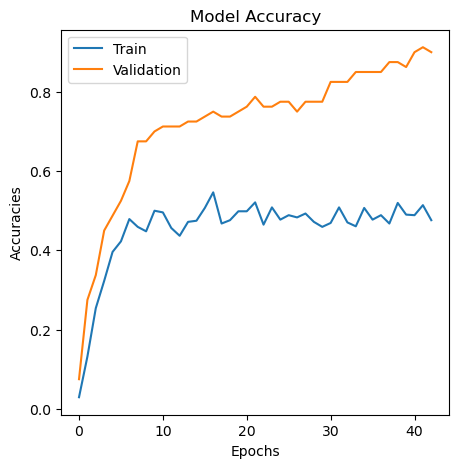

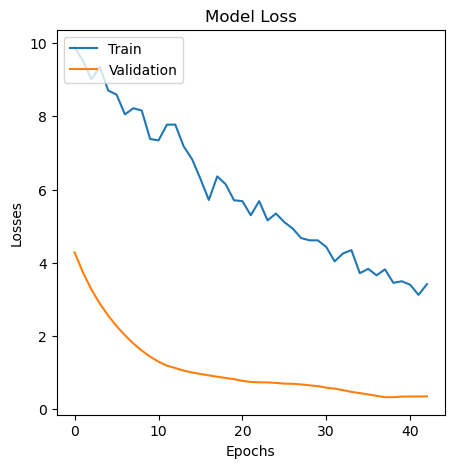


Evaluate on test data
7/7 [==============================] - 0s 3ms/step - loss: 3.8928 - accuracy: 0.6061
Test Loss: 3.8928065299987793, Test Accuracy: 0.6060606241226196

End of Trail
***********************************************************************************************


In [31]:
dropout_rates = [0.1, 0.3, 0.5]
print(f'Start Dropout Rate Trails of values: {dropout_rates}')
for dropout_rate in dropout_rates:
    print('***********************************************************************************************')
    print(f'Start of Dropout Rate: {dropout_rate}, Trail')
    print()
    model = create_model_Adam(hidden = 256, with_dropout = True, dropout_rate = dropout_rate, lr = 0.001, l2 = None)
    print()
    history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
    print()
    display_accuracy(history)
    print()
    display_val_accuracy(history)
    print()
    evaluate(model)
    print()
    print(f'End of Trail')
    print('***********************************************************************************************')

# Learning Rates Trails

Start Learning Rate Trails of values: [0.01, 0.001, 0.0001]
***********************************************************************************************
Start of Learning Rate: 0.01, Trail


Epoch 1/50
6/6 [==============================] - 1s 38ms/step - loss: 4.2895 - accuracy: 0.3455 - val_loss: 1.2749 - val_accuracy: 0.7125
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 1.9321 - accuracy: 0.8160 - val_loss: 0.6002 - val_accuracy: 0.8125
Epoch 3/50
6/6 [==============================] - 0s 10ms/step - loss: 1.2254 - accuracy: 0.8975 - val_loss: 0.4150 - val_accuracy: 0.8750
Epoch 4/50
6/6 [==============================] - 0s 10ms/step - loss: 1.1229 - accuracy: 0.8975 - val_loss: 0.3627 - val_accuracy: 0.8875
Epoch 5/50
6/6 [==============================] - 0s 10ms/step - loss: 1.0530 - accuracy: 0.8820 - val_loss: 0.3216 - val_accuracy: 0.8750
Epoch 6/50
6/6 [==============================] - 0s 10ms/step - loss: 1.0306 - accuracy: 0.8904 - val_loss: 0.4

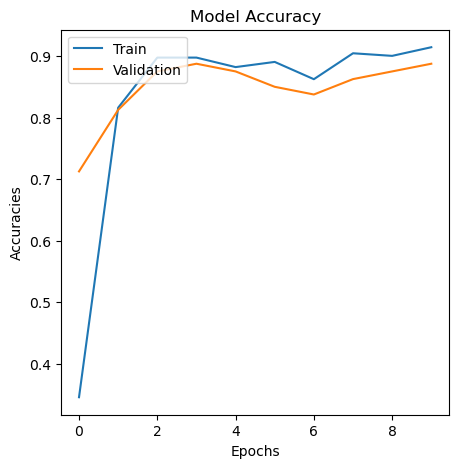

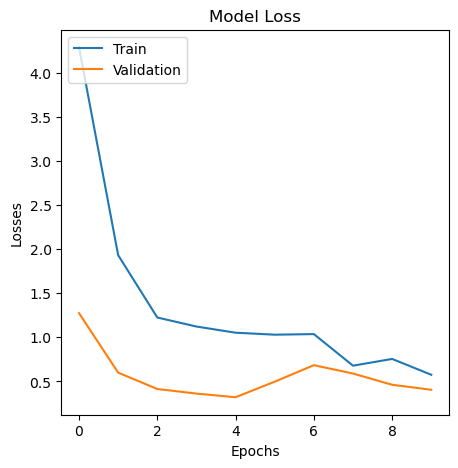


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 3.6508 - accuracy: 0.4192
Test Loss: 3.650751829147339, Test Accuracy: 0.4191919267177582

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Learning Rate: 0.001, Trail


Epoch 1/50
6/6 [==============================] - 1s 36ms/step - loss: 5.7244 - accuracy: 0.0323 - val_loss: 4.0754 - val_accuracy: 0.1250
Epoch 2/50
6/6 [==============================] - 0s 10ms/step - loss: 4.8779 - accuracy: 0.2402 - val_loss: 3.4530 - val_accuracy: 0.2875
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 4.0867 - accuracy: 0.4368 - val_loss: 2.9204 - val_accuracy: 0.4125
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 3.4758 - accuracy: 0.6419 - val_loss: 2.4792 - val_accuracy: 0.5375
Epoch 5/50
6/6 [=============

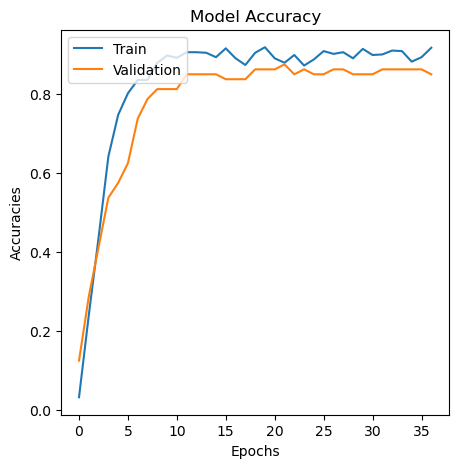

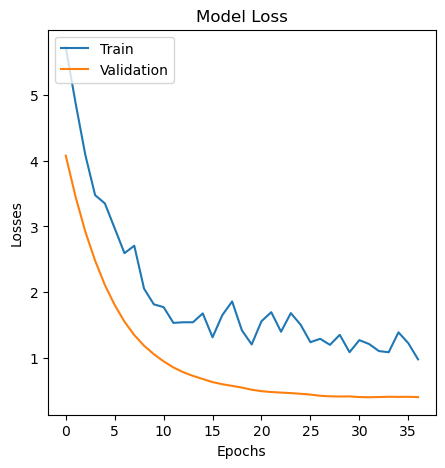


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2146 - accuracy: 0.5303
Test Loss: 4.214558124542236, Test Accuracy: 0.5303030014038086

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Learning Rate: 0.0001, Trail


Epoch 1/50
6/6 [==============================] - 1s 35ms/step - loss: 5.8619 - accuracy: 0.0084 - val_loss: 4.7431 - val_accuracy: 0.0250
Epoch 2/50
6/6 [==============================] - 0s 8ms/step - loss: 5.7763 - accuracy: 0.0169 - val_loss: 4.6670 - val_accuracy: 0.0250
Epoch 3/50
6/6 [==============================] - 0s 10ms/step - loss: 5.5238 - accuracy: 0.0211 - val_loss: 4.5928 - val_accuracy: 0.0375
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 5.5173 - accuracy: 0.0295 - val_loss: 4.5193 - val_accuracy: 0.0375
Epoch 5/50
6/6 [============

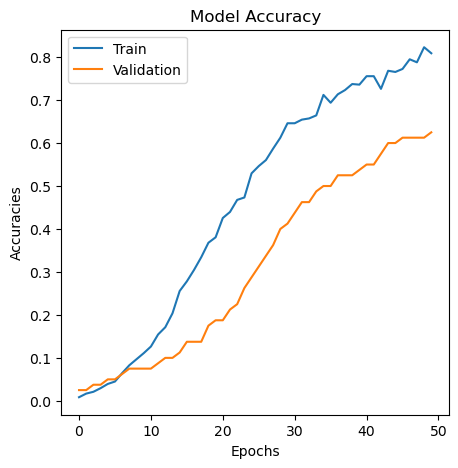

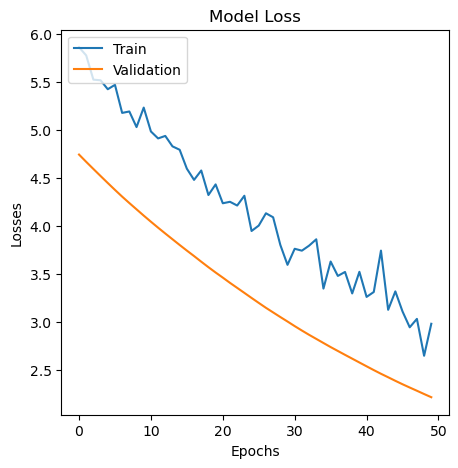


Evaluate on test data
7/7 [==============================] - 0s 3ms/step - loss: 4.4839 - accuracy: 0.5253
Test Loss: 4.483903884887695, Test Accuracy: 0.5252525210380554

End of Trail
***********************************************************************************************


In [32]:
learning_rates = [0.01, 0.001, 0.0001]
print(f'Start Learning Rate Trails of values: {learning_rates}')
for learning_rate in learning_rates:
    print('***********************************************************************************************')
    print(f'Start of Learning Rate: {learning_rate}, Trail')
    print()
    model = create_model_Adam(hidden = 256, with_dropout = True, dropout_rate = 0.1, lr = learning_rate, l2 = None)
    print()
    history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
    print()
    display_accuracy(history)
    print()
    display_val_accuracy(history)
    print()
    evaluate(model)
    print()
    print(f'End of Trail')
    print('***********************************************************************************************')

#  Regularization Trails

Start Regularization Trails of values: [0.01, 0.001, 0.0001]
***********************************************************************************************
Start of Weight Decay: 0.01, Trail


Epoch 1/50
6/6 [==============================] - 1s 34ms/step - loss: 5.6330 - accuracy: 0.0267 - val_loss: 4.1301 - val_accuracy: 0.0750
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 5.0040 - accuracy: 0.2121 - val_loss: 3.5711 - val_accuracy: 0.2500
Epoch 3/50
6/6 [==============================] - 0s 8ms/step - loss: 4.3372 - accuracy: 0.4382 - val_loss: 3.1085 - val_accuracy: 0.4125
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 3.6742 - accuracy: 0.6699 - val_loss: 2.7169 - val_accuracy: 0.5125
Epoch 5/50
6/6 [==============================] - 0s 9ms/step - loss: 2.8911 - accuracy: 0.7907 - val_loss: 2.4016 - val_accuracy: 0.5500
Epoch 6/50
6/6 [==============================] - 0s 9ms/step - loss: 3.1649 - accuracy: 0.8076 - val_loss: 2.1351 

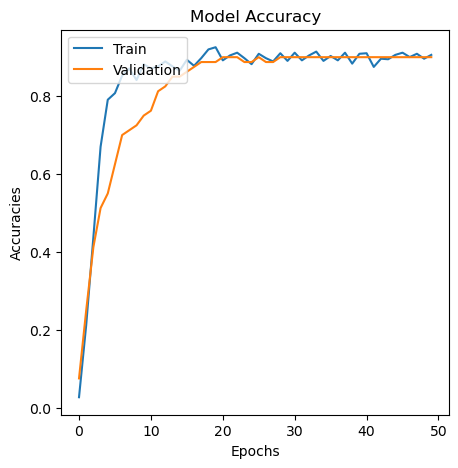

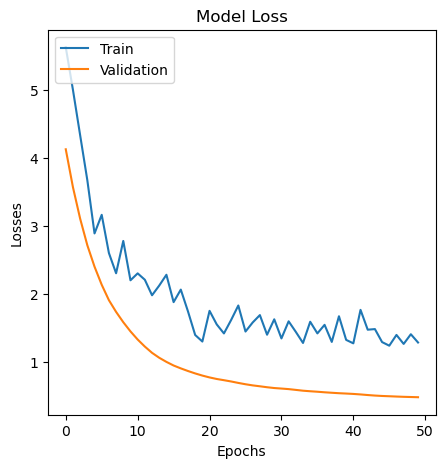


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2993 - accuracy: 0.4949
Test Loss: 4.299262523651123, Test Accuracy: 0.49494948983192444

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Weight Decay: 0.001, Trail


Epoch 1/50
6/6 [==============================] - 1s 37ms/step - loss: 5.5375 - accuracy: 0.0421 - val_loss: 4.0536 - val_accuracy: 0.0375
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 4.5644 - accuracy: 0.2500 - val_loss: 3.4675 - val_accuracy: 0.2000
Epoch 3/50
6/6 [==============================] - 0s 8ms/step - loss: 3.9610 - accuracy: 0.5000 - val_loss: 2.9758 - val_accuracy: 0.4125
Epoch 4/50
6/6 [==============================] - 0s 9ms/step - loss: 3.4601 - accuracy: 0.6643 - val_loss: 2.5520 - val_accuracy: 0.5750
Epoch 5/50
6/6 [==============

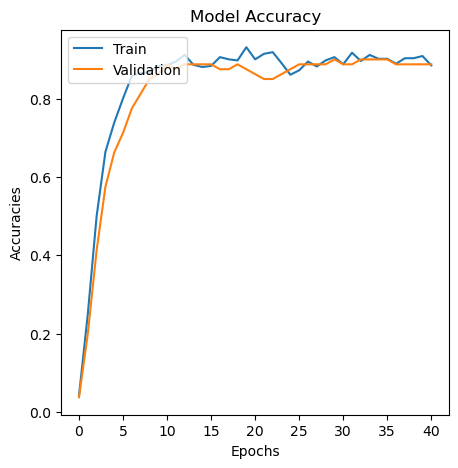

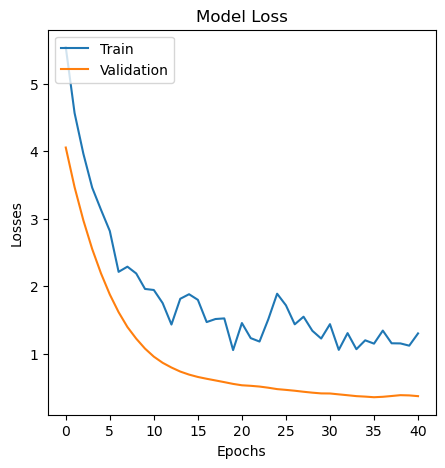


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.2138 - accuracy: 0.6313
Test Loss: 4.213803291320801, Test Accuracy: 0.631313145160675

End of Trail
***********************************************************************************************
***********************************************************************************************
Start of Weight Decay: 0.0001, Trail


Epoch 1/50
6/6 [==============================] - 1s 37ms/step - loss: 5.7619 - accuracy: 0.0379 - val_loss: 4.0968 - val_accuracy: 0.0750
Epoch 2/50
6/6 [==============================] - 0s 12ms/step - loss: 4.5037 - accuracy: 0.2458 - val_loss: 3.4824 - val_accuracy: 0.3250
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 3.9821 - accuracy: 0.5056 - val_loss: 2.9696 - val_accuracy: 0.4375
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 3.6476 - accuracy: 0.6643 - val_loss: 2.5232 - val_accuracy: 0.5625
Epoch 5/50
6/6 [==============

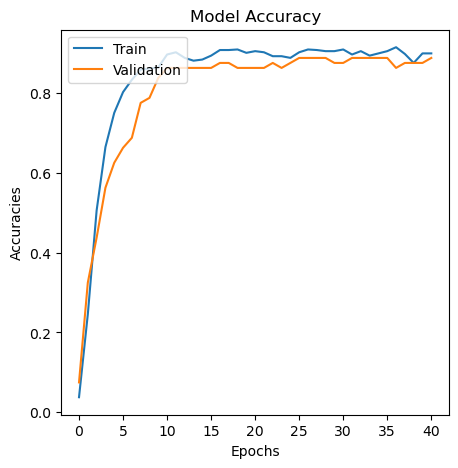

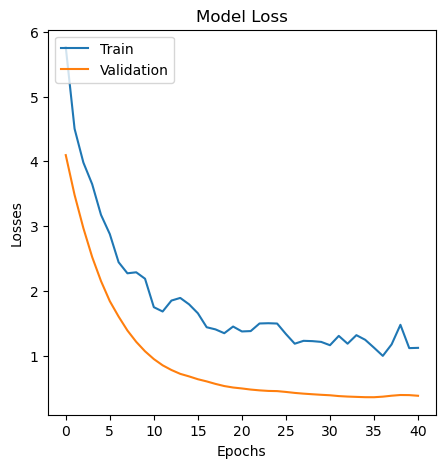


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.1919 - accuracy: 0.7222
Test Loss: 4.191899299621582, Test Accuracy: 0.7222222089767456

End of Trail
***********************************************************************************************


In [33]:
decaies = [0.01, 0.001, 0.0001]
print(f'Start Regularization Trails of values: {decaies}')
for decay in decaies:
    print('***********************************************************************************************')
    print(f'Start of Weight Decay: {decay}, Trail')
    print()
    model = create_model_Adam(hidden = 256, with_dropout = True, dropout_rate = 0.1, lr = 0.001, l2 = decay)
    print()
    history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
    print()
    display_accuracy(history)
    print()
    display_val_accuracy(history)
    print()
    evaluate(model)
    print()
    print(f'End of Trail')
    print('***********************************************************************************************')

# Optimizer Trails

***********************************************************************************************
Start of SGD Optimizer Trail


Epoch 1/50
6/6 [==============================] - 0s 37ms/step - loss: 6.0643 - accuracy: 0.0098 - val_loss: 4.7506 - val_accuracy: 0.0125
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 6.0467 - accuracy: 0.0126 - val_loss: 4.7452 - val_accuracy: 0.0125
Epoch 3/50
6/6 [==============================] - 0s 8ms/step - loss: 5.9916 - accuracy: 0.0098 - val_loss: 4.7400 - val_accuracy: 0.0125
Epoch 4/50
6/6 [==============================] - 0s 8ms/step - loss: 6.0439 - accuracy: 0.0112 - val_loss: 4.7348 - val_accuracy: 0.0125
Epoch 5/50
6/6 [==============================] - 0s 8ms/step - loss: 5.8480 - accuracy: 0.0126 - val_loss: 4.7293 - val_accuracy: 0.0125
Epoch 6/50
6/6 [==============================] - 0s 8ms/step - loss: 6.0258 - accuracy: 0.0126 - val_loss: 4.7240 - val_accuracy: 0.0125
Epoch 7/50
6/6 [============================

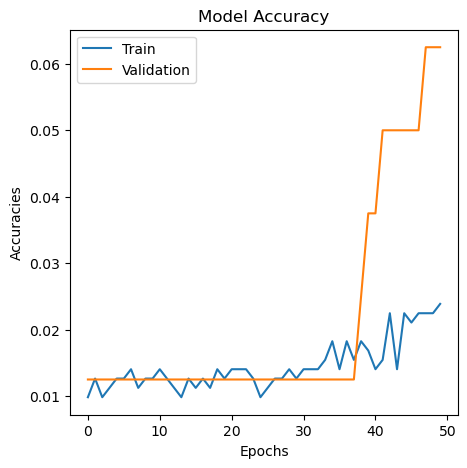

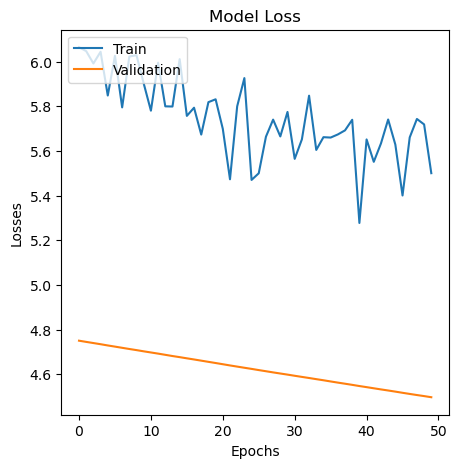


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.5858 - accuracy: 0.0202
Test Loss: 4.585794925689697, Test Accuracy: 0.020202020183205605

End of Trail
***********************************************************************************************


In [34]:
print('***********************************************************************************************')
print(f'Start of SGD Optimizer Trail')
print()
model = create_model_SGD(hidden = 256, with_dropout = True, dropout_rate = 0.1, lr = 0.001, l2 = None)
print()
history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
print()
display_accuracy(history)
print()
display_val_accuracy(history)
print()
evaluate(model)
print()
print(f'End of Trail')
print('***********************************************************************************************')

***********************************************************************************************
Start of RMSP Optimizer Trail


Epoch 1/50
6/6 [==============================] - 1s 38ms/step - loss: 5.2969 - accuracy: 0.0955 - val_loss: 3.4663 - val_accuracy: 0.2250
Epoch 2/50
6/6 [==============================] - 0s 9ms/step - loss: 4.0903 - accuracy: 0.4761 - val_loss: 2.8935 - val_accuracy: 0.3875
Epoch 3/50
6/6 [==============================] - 0s 9ms/step - loss: 3.6088 - accuracy: 0.6728 - val_loss: 2.4350 - val_accuracy: 0.5875
Epoch 4/50
6/6 [==============================] - 0s 12ms/step - loss: 3.1137 - accuracy: 0.7725 - val_loss: 2.0606 - val_accuracy: 0.7125
Epoch 5/50
6/6 [==============================] - 0s 9ms/step - loss: 2.5533 - accuracy: 0.8301 - val_loss: 1.7751 - val_accuracy: 0.7375
Epoch 6/50
6/6 [==============================] - 0s 9ms/step - loss: 2.3816 - accuracy: 0.8567 - val_loss: 1.5021 - val_accuracy: 0.8000
Epoch 7/50
6/6 [==========================

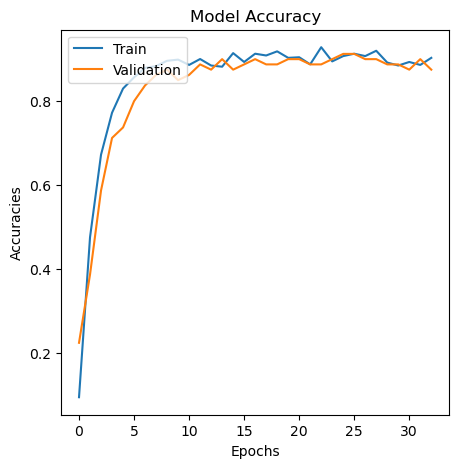

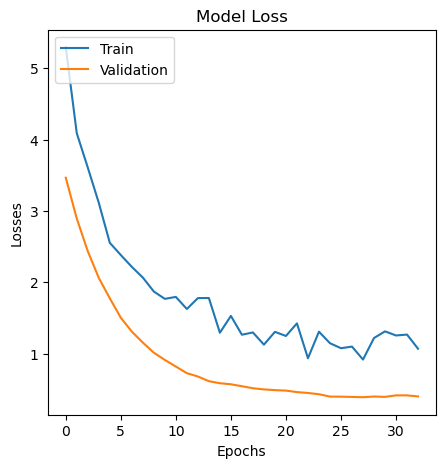


Evaluate on test data
7/7 [==============================] - 0s 2ms/step - loss: 4.1767 - accuracy: 0.6818
Test Loss: 4.176685810089111, Test Accuracy: 0.6818181872367859

End of Trail
***********************************************************************************************


In [35]:
print('***********************************************************************************************')
print(f'Start of RMSP Optimizer Trail')
print()
model = create_model_RMSP(hidden = 256, with_dropout = True, dropout_rate = 0.1, lr = 0.001, l2 = None)
print()
history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_split = 0.1, callbacks=[callback])
print()
display_accuracy(history)
print()
display_val_accuracy(history)
print()
evaluate(model)
print()
print(f'End of Trail')
print('***********************************************************************************************')